In [1]:
import sys
# adding to the path variables the one folder higher (locally, not changing system variables)
sys.path.append("..")
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import rasterio
import rasterio.rio
import geopandas as geopd
import pyreadr
import datetime as dt 
import warnings
import h3

from rasterio.plot import show

In [2]:
df_sample = geopd.read_file("../data/final_shapefiles/sample_points.shp")

In [3]:
veg_num = {
    "Bog" : 1,
    "Bush" : 2,
    "Dry Shrub" : 3,
    "Grassland" : 4,
    "Moist Shrub" : 5,
    "Snow" : 6,
    "Stone" : 7,
    "Water" : 8,
}

In [4]:
df_sample["veg_num"] = [veg_num[veg] for veg in df_sample.veg]

In [5]:
df_sample.set_crs(3006, inplace = True)
df_sample.to_crs(4326, inplace = True)

In [6]:
df_sample["lon"]  = df_sample.geometry.x
df_sample["lat"]  = df_sample.geometry.y

In [7]:
def plot_scatter(df, metric_col, x='lon', y='lat', marker='.', alpha=1, figsize=(16,12), colormap='viridis'):    
    df.plot.scatter(x=x, y=y, c=metric_col, title=metric_col
                    , edgecolors='none', colormap=colormap, marker=marker, alpha=alpha, figsize=figsize);
    plt.xticks([], []); plt.yticks([], [])

In [8]:
APERTURE_SIZE = 10
hex_col = 'hex'+str(APERTURE_SIZE)

# find hexs containing the points
df_sample[hex_col] = df_sample.apply(lambda x: h3.geo_to_h3(x.lon,x.lat,APERTURE_SIZE),1)



In [9]:
# aggregate the points
df_sample_g = df_sample.groupby(hex_col).max().reset_index()

#find center of hex for visualization
df_sample_g['lon'] = df_sample_g[hex_col].apply(lambda x: h3.h3_to_geo(x)[0])
df_sample_g['lat'] = df_sample_g[hex_col].apply(lambda x: h3.h3_to_geo(x)[1])


/tmp/ipykernel_18470/2110602816.py:2: FutureWarning: Dropping invalid columns in DataFrameGroupBy.max is deprecated. In a future version, a TypeError will be raised. Before calling .max, select only columns which should be valid for the function.
  df_sample_g = df_sample.groupby(hex_col).max().reset_index()


In [10]:
palette = ["#003d14", "#ff8700", "#abd500", "#0dd500", "#26a751", "#96fee8", "#818181", "#1c45ff"]

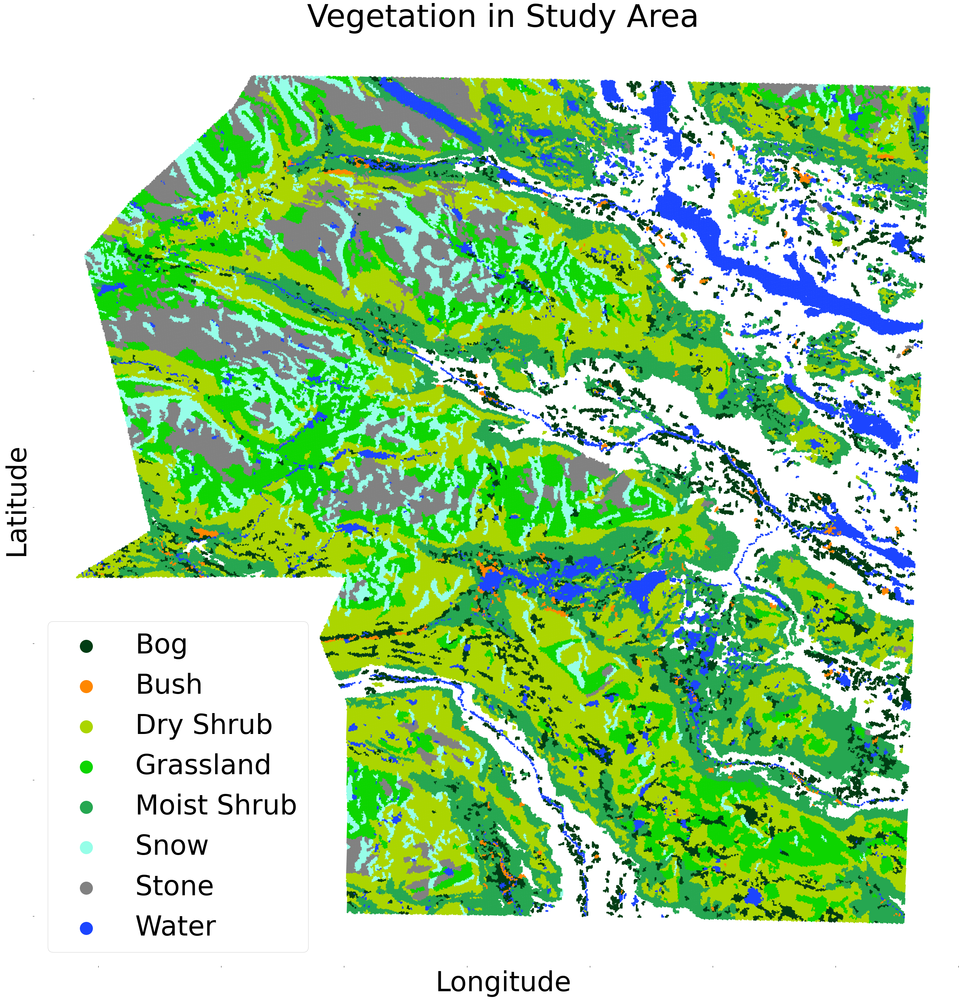

In [11]:
plt.figure(figsize = (40,40))
ax = sns.scatterplot(data = df_sample_g, x = "lon", y = "lat", hue = "veg_num", marker = "h", palette = palette, linewidth = 0, legend = "full", s = 23)
plt.title('Vegetation in Study Area', fontsize = 75)
plt.xlabel("Longitude", fontsize = 65)
plt.ylabel("Latitude", fontsize = 65)
legend = plt.legend(fontsize = 65, markerscale = 5) 
for k, v in veg_num.items():
    legend.get_texts()[v-1].set_text(k)
ax.set(xticklabels=[], yticklabels = []);
sns.despine(top = True, left = True, right = True, bottom = True)

In [12]:
# aggregate the points
df_sample_g = df_sample.groupby(hex_col).mean().reset_index()

#find center of hex for visualization
df_sample_g['lon'] = df_sample_g[hex_col].apply(lambda x: h3.h3_to_geo(x)[0])
df_sample_g['lat'] = df_sample_g[hex_col].apply(lambda x: h3.h3_to_geo(x)[1])


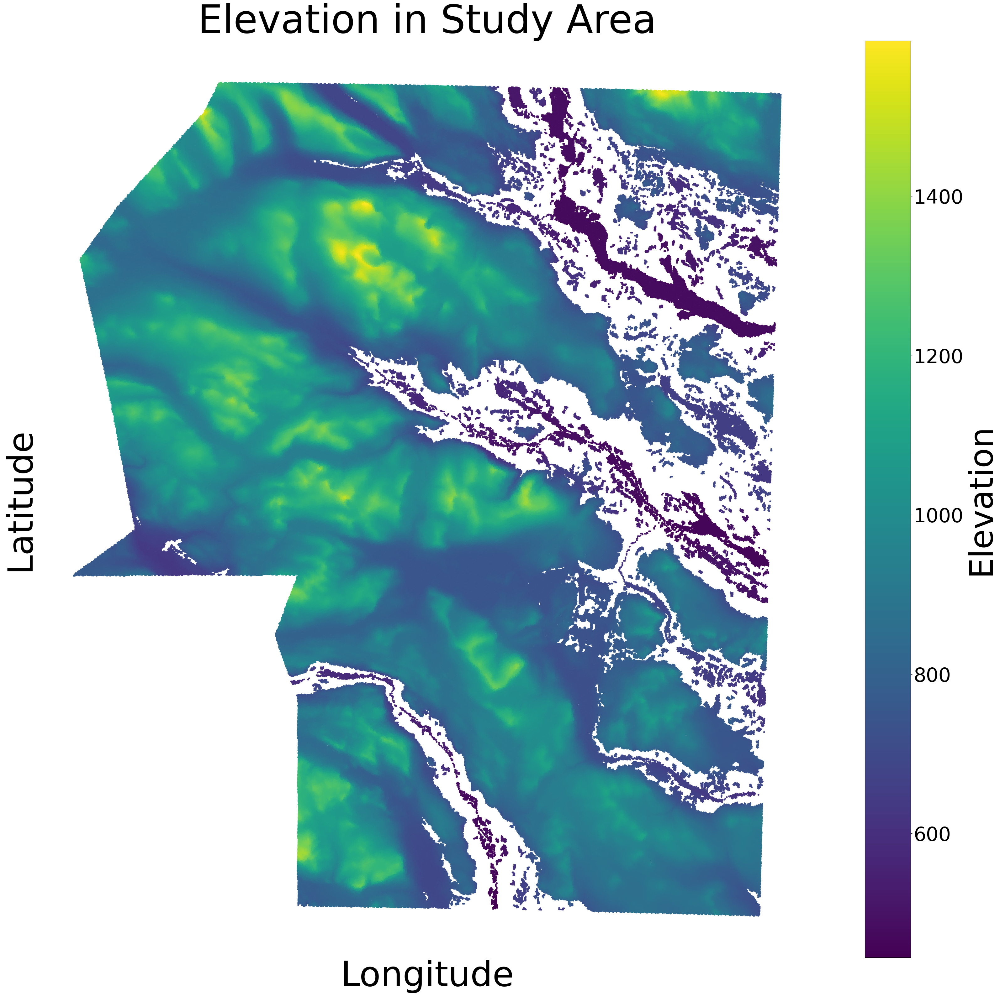

In [13]:
# pltot the hexs
plot_scatter(df_sample_g, metric_col='elev',figsize=(40,38), marker='h')
plt.title('Elevation in Study Area', fontsize = 90)
plt.xlabel("Longitude", fontsize = 80)
plt.ylabel("Latitude", fontsize = 80)
f = plt.gcf()
ax = f.get_axes()[1]
ax.set_ylabel("Elevation", fontsize = 75)
ax.tick_params(labelsize = 45)
sns.despine(top = True, left = True, right = True, bottom = True);

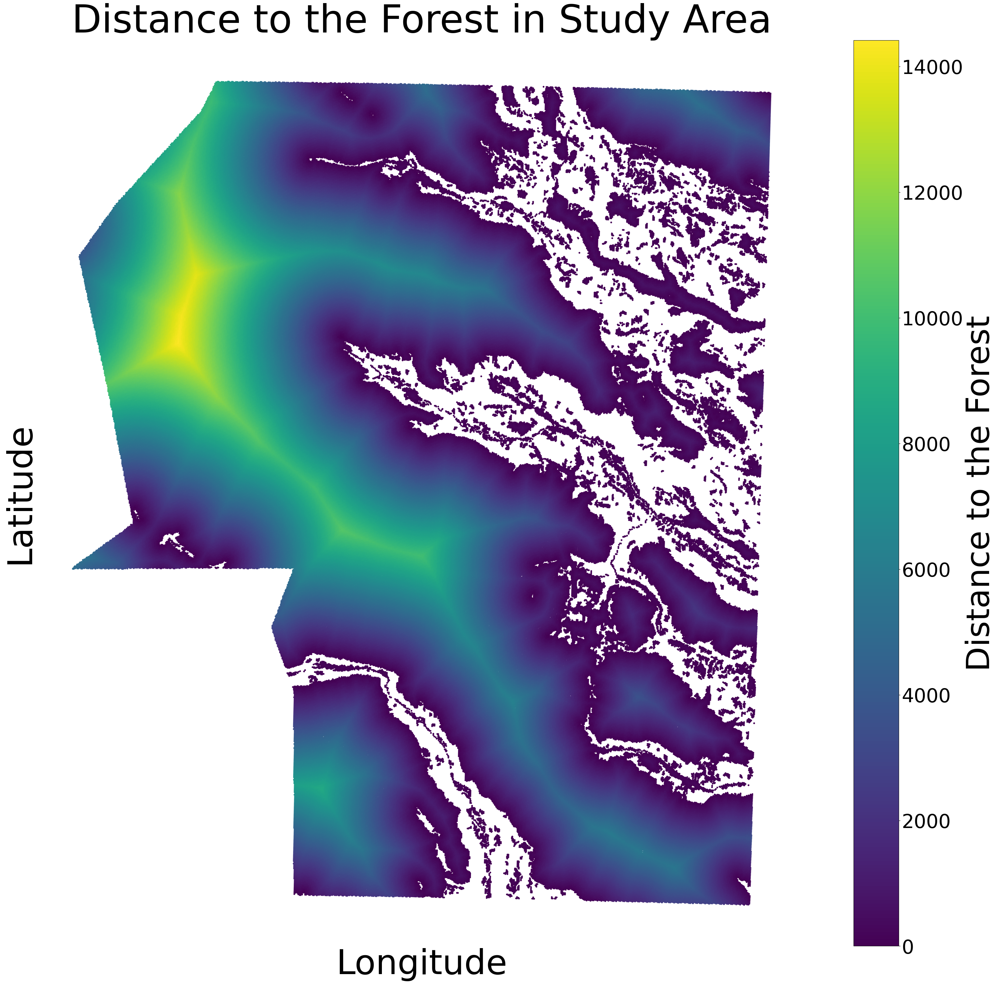

In [15]:
# pltot the hexs
plot_scatter(df_sample_g, metric_col='distForest',figsize=(40,38), marker='h')
plt.title('Distance to the Forest in Study Area', fontsize = 90)
plt.xlabel("Longitude", fontsize = 80)
plt.ylabel("Latitude", fontsize = 80)
f = plt.gcf()
ax = f.get_axes()[1]
ax.set_ylabel("Distance to the Forest", fontsize = 75)
ax.tick_params(labelsize = 45)
sns.despine(top = True, left = True, right = True, bottom = True);